In [1]:
import cmocean.cm as cm
import copy
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from salishsea_tools import viz_tools

In [2]:
# mesh mask file for land mask
meshmask = xr.open_dataset('/home/sallen/MEOPAR/grid/mesh_mask202108.nc')
tmask = meshmask.tmask[0]
# ensure tmask has same dimensions as field
tmask = tmask.rename({'z' : 'deptht'})

In [3]:
# make land versions of cmaps, land is grey
cm_salt = copy.copy(cm.haline)
cm_salt.set_bad('grey')
cm_bwr = copy.copy(cm.balance)
cm_bwr.set_bad('grey')
cm_temp = copy.copy(cm.thermal)
cm_temp.set_bad('grey')

In [4]:
base = xr.open_dataset('/data/sallen/results/MEOPAR/wastewater/base_again/SalishSea_1h_20230301_20230301_grid_T.nc')
tands = xr.open_dataset('/data/sallen/results/MEOPAR/wastewater/tands//SalishSea_1h_20230301_20230301_grid_T.nc')

In [5]:
def get_uv(dir, it, ide, x_slice, y_slice):
    # read in both the u and v velocity components
    base_u = xr.open_dataset(f'/data/sallen/results/MEOPAR/wastewater/{dir}/SalishSea_1h_20230301_20230301_grid_U.nc')
    base_v = xr.open_dataset(f'/data/sallen/results/MEOPAR/wastewater/{dir}/SalishSea_1h_20230301_20230301_grid_V.nc')

# the u velocity is staggered in the x direction, unstagger it
    u_region = viz_tools.unstagger_xarray(
        base_u.vozocrtx.isel(time_counter=it, depthu=ide, y=y_slice, x=x_slice), 'x')

# the v velocity is staggered in the y direction, unstagger it
    v_region = viz_tools.unstagger_xarray(
        base_v.vomecrty.isel(time_counter=it, depthv=ide, y=y_slice, x=x_slice), 'y')

    
# merge u and v into one dataset, dropping the now inaccurate nav_lon and nav_lat varaiables
    base_uv = xr.merge([u_region.rename({'depthu': 'deptht'}).drop(['nav_lon', 'nav_lat']), 
                    v_region.rename({'depthv': 'deptht'}).drop(['nav_lon', 'nav_lat'])])
    

# give x and y there own coordinate names
    base_uv = base_uv.assign(grid_X=lambda alpha: alpha.x)
    base_uv = base_uv.assign(grid_Y=lambda alpha: alpha.y)

    return base_uv

In [6]:
def plot_w_quiver(base_dir, base, new_dir, new, field, it, ide, cmap, vmax, vmin, dvmax):
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    step = 3
    
    iz = 30  # width of domain plotted
    y_slice=slice(400+iz, 500-iz)
    x_slice=slice(250+iz, 350-iz)
    
    (base[field]
     .isel(time_counter=it, deptht=ide, y=y_slice, x=x_slice)
     .where(tmask.isel(z=ide, y=y_slice, x=x_slice))
    	.plot(ax=axs[0], cmap=cmap, vmax=vmax, vmin=vmin));
    
    base_uv = get_uv(base_dir, it, ide, x_slice, y_slice)
    
    (base_uv
     .isel(x=slice(None, None, step), y=slice(None, None,step))
     .plot.quiver(x='grid_X', y='grid_Y', u='vozocrtx', v='vomecrty', 
                        pivot='mid', ax=axs[0]));

    bigarrow2 = (base_uv.vozocrtx**2 + base_uv.vomecrty**2).max().values
    axs[0].text(20, 5, f'Max vel {np.sqrt(bigarrow2):.2f} m/s')

    (new[field]
     .isel(time_counter=it, deptht=ide, y=y_slice, x=x_slice)
     .where(tmask.isel(z=ide, y=y_slice, x=x_slice))
    	.plot(ax=axs[1], cmap=cmap, vmax=vmax, vmin=vmin));

    new_uv = get_uv(new_dir, it, ide, x_slice, y_slice)

    (new_uv
     .isel(x=slice(None, None, step), y=slice(None, None,step))
     .plot.quiver(x='grid_X', y='grid_Y', u='vozocrtx', v='vomecrty', 
                        pivot='mid', ax=axs[1]));

    bigarrow2 = (new_uv.vozocrtx**2 + new_uv.vomecrty**2).max().values
    axs[1].text(20, 5, f'Max vel {np.sqrt(bigarrow2):.2f} m/s')

    ((new[field]
     .isel(time_counter=it, deptht=ide, y=y_slice, x=x_slice)
     - base[field]
     .isel(time_counter=it, deptht=ide, y=y_slice, x=x_slice))
     .where(tmask.isel(z=ide, y=y_slice, x=x_slice))
    	.plot(ax=axs[2], cmap=cm_bwr, vmax=dvmax, vmin=-dvmax))

    diff = new_uv - base_uv
    # reset grid_X and grid_Y as they are now all zero
    diff = diff.assign(grid_X=lambda alpha: alpha.x)
    diff = diff.assign(grid_Y=lambda alpha: alpha.y)
    
    (diff
     .isel(x=slice(None, None, step), y=slice(None, None,step))
     .plot.quiver(x='grid_X', y='grid_Y', u='vozocrtx', v='vomecrty', 
                        pivot='mid', scale=0.5, ax=axs[2]));

    bigarrow2 = (diff.vozocrtx**2 + diff.vomecrty**2).max().values
    axs[2].text(20, 5, f'Max vel {np.sqrt(bigarrow2):.2f} m/s')
    
    for ax in axs:
        viz_tools.set_aspect(ax)

<xarray.DataArray 'vomecrty' (y: 40, x: 40)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [-0.09980981, -0.08325633, -0.09736082, ...,  0.        ,
         0.        ,  0.        ],
       [-0.09829605, -0.07891753, -0.08924541, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.02646119,  0.02229849,  0.02103984, ...,  0.01900636,
         0.02866495,  0.02933933],
       [ 0.03046657,  0.02494439,  0.02223872, ...,  0.00863044,
         0.03137799,  0.04422345],
       [ 0.03551825,  0.02978356,  0.02445109, ...,  0.00393363,
         0.02639472,  0.03998362]], dtype=float32)
Coordinates:
    nav_lat        (y, x) float32 49.09 49.09 49.1 49.1 ... 49.32 49.32 49.32
    nav_lon        (y, x) float32 -123.4 -123.4 -123.4 ... -123.3 -123.3 -123.3
    depthv         float32 76.59
    time_centered  datetime64[ns] 2023-03-01T23:30:00
    time_counter   datetime64[ns] 2023-03-01T23:30:00
Dimensions with

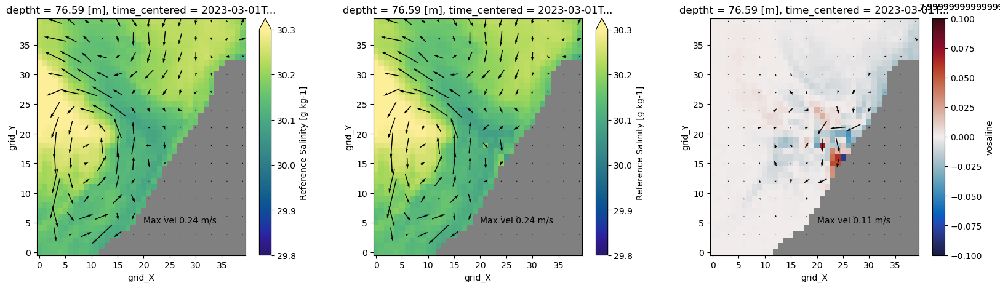

In [10]:
plot_w_quiver('base_again', base, 'tands', tands, 'vosaline', 23, 25, cm_salt, 30.3, 29.8, 0.1)

/tmp/ipykernel_2281510/1779629394.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize=(20, 5))
/home/jtao/conda_envs/analysis-jake/lib/python3.11/site-packages/matplotlib/quiver.py:646: RuntimeWarning: divide by zero encountered in scalar divide
  length = a * (widthu_per_lenu / (self.scale * self.width))
/home/jtao/conda_envs/analysis-jake/lib/python3.11/site-packages/matplotlib/quiver.py:646: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))


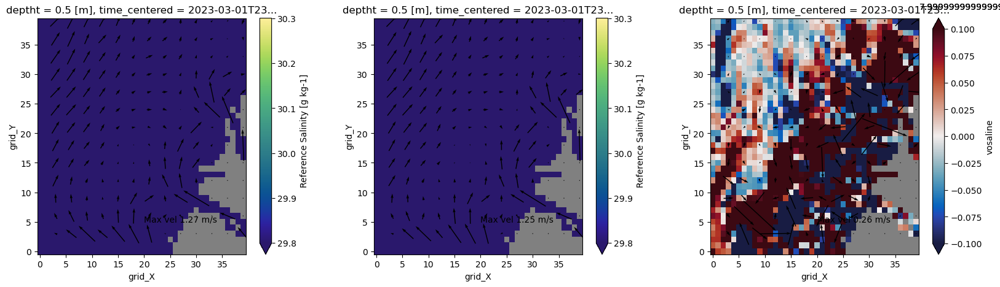

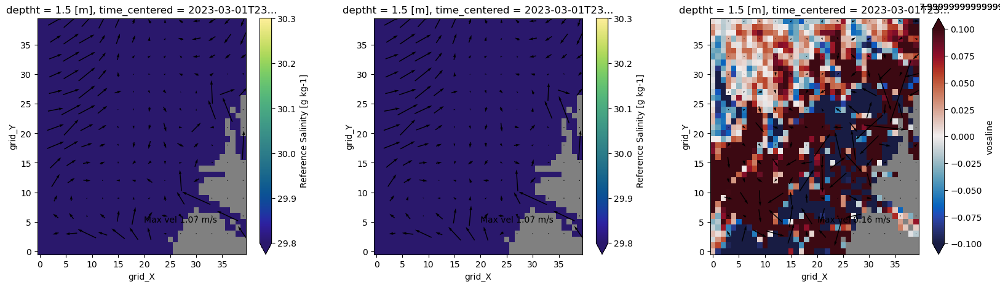

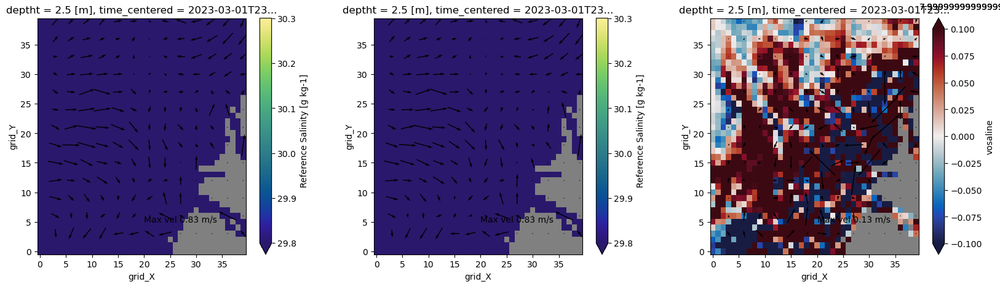

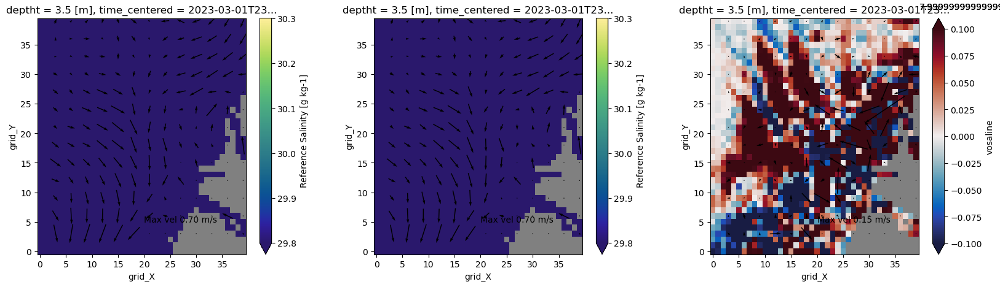

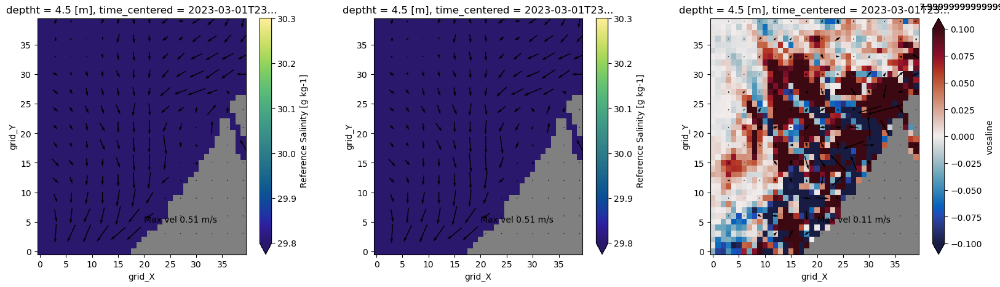

...

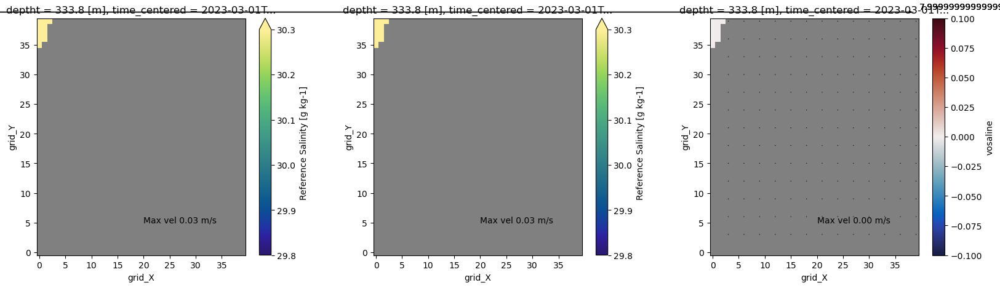

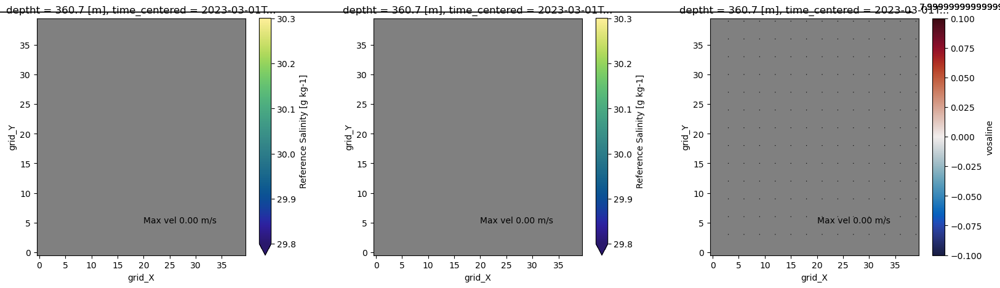

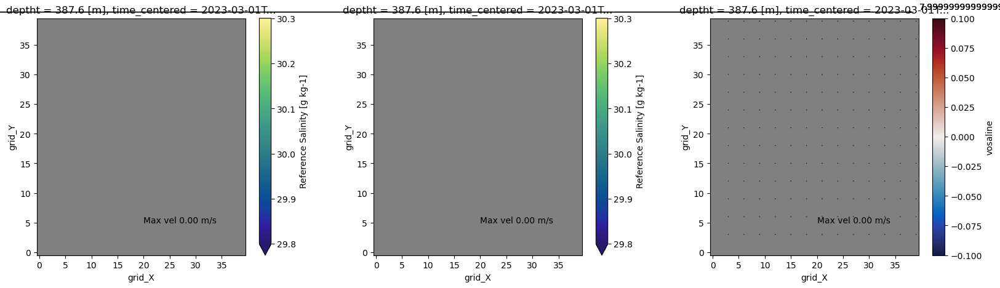

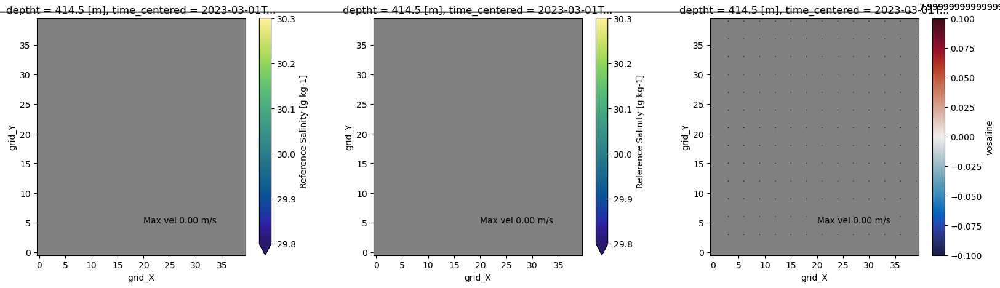

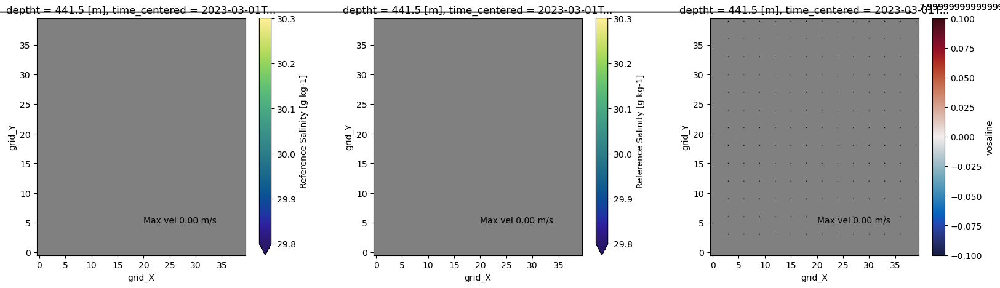

In [7]:
for i in range (0,40):
    plot_w_quiver('base_again', base, 'tands', tands, 'vosaline', 23, i, cm_salt, 30.3, 29.8, 0.1)

/tmp/ipykernel_2281510/1779629394.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize=(20, 5))
/home/jtao/conda_envs/analysis-jake/lib/python3.11/site-packages/matplotlib/quiver.py:646: RuntimeWarning: divide by zero encountered in scalar divide
  length = a * (widthu_per_lenu / (self.scale * self.width))
/home/jtao/conda_envs/analysis-jake/lib/python3.11/site-packages/matplotlib/quiver.py:646: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))


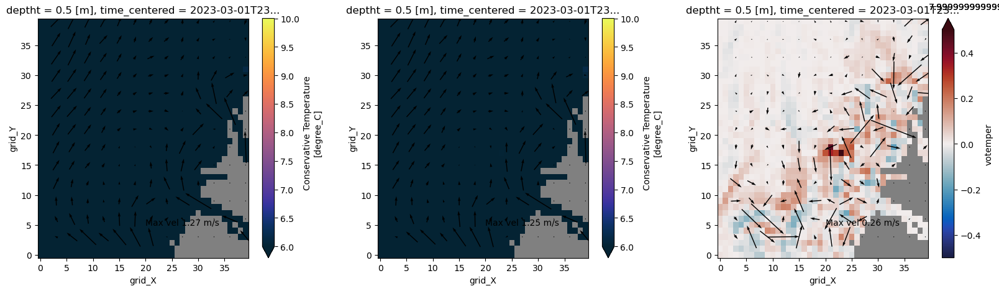

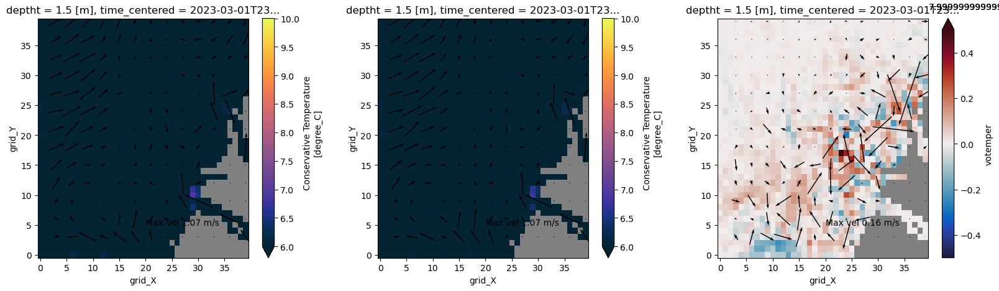

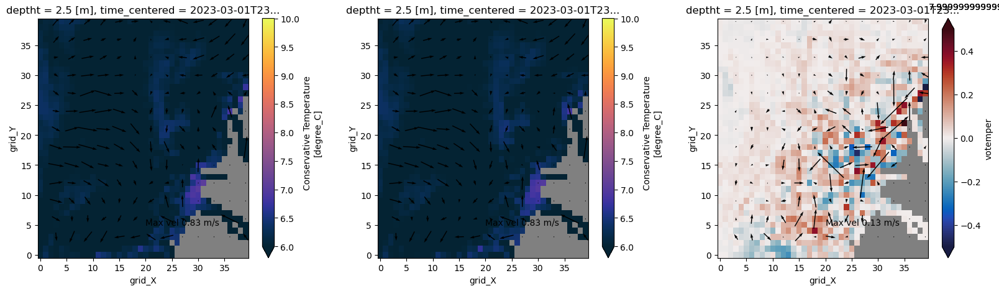

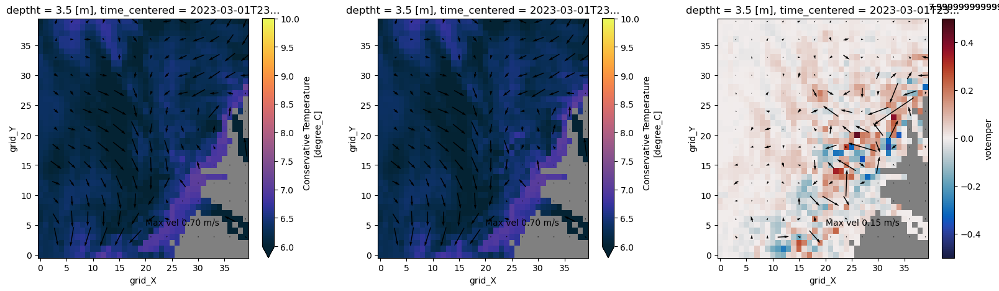

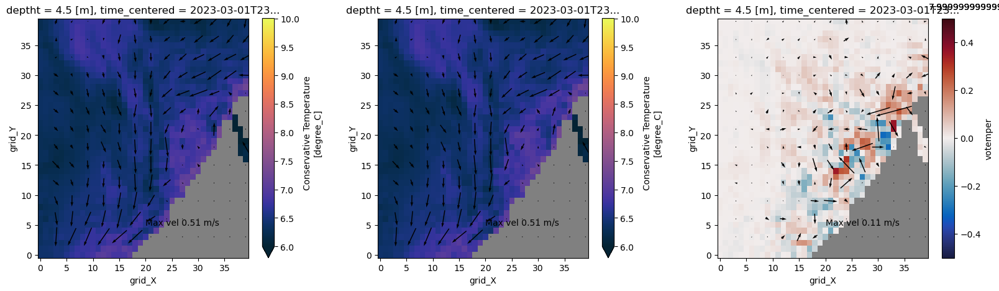

...

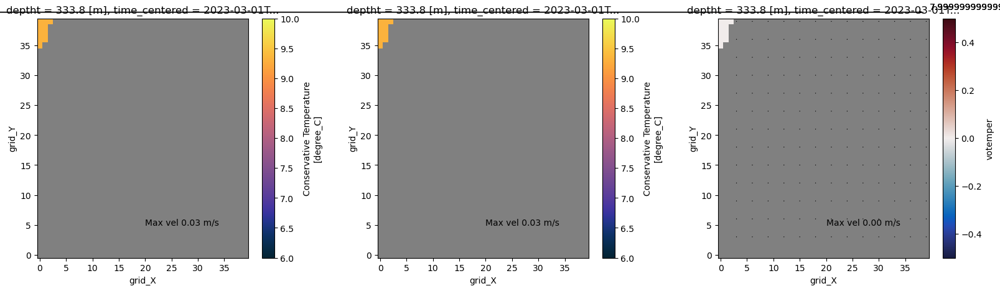

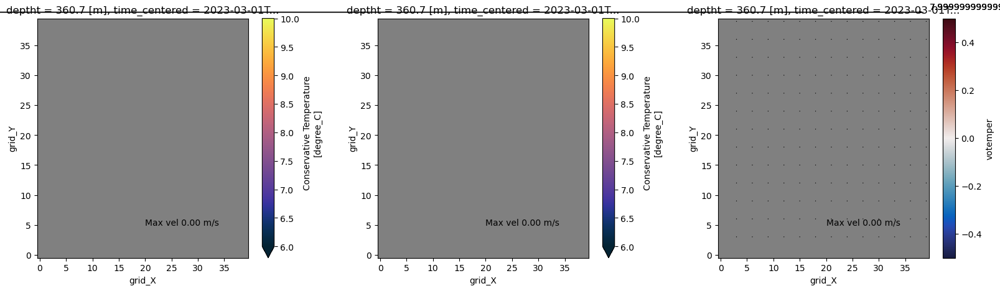

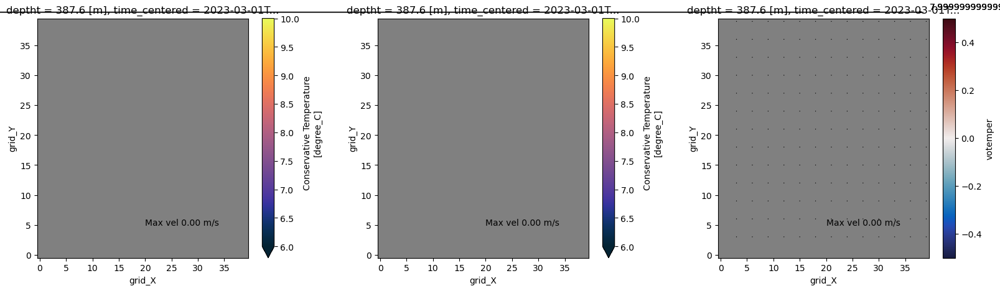

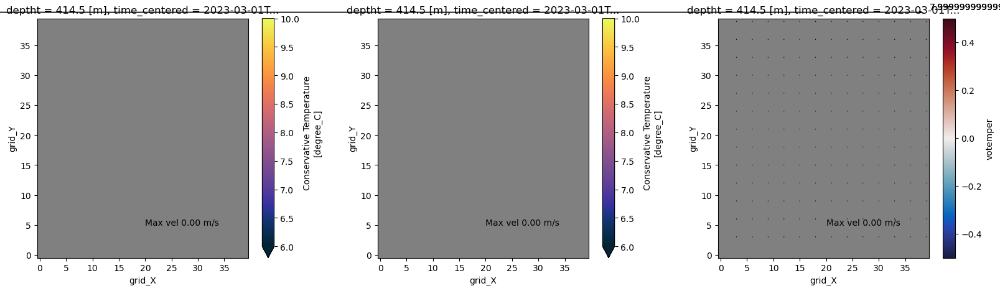

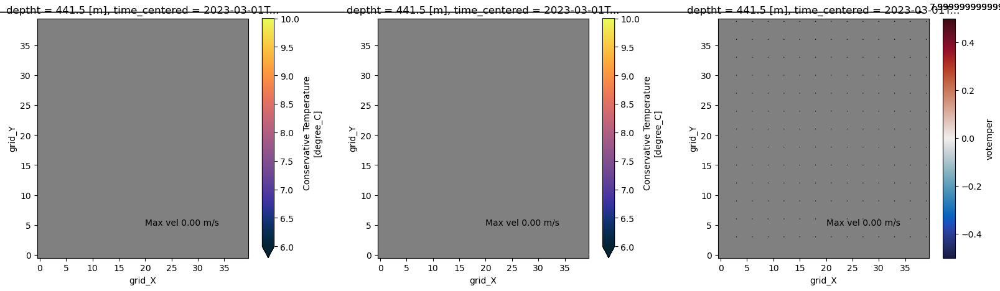

In [10]:
for i in range (0,40):
    plot_w_quiver('base_again', base, 'tands', tands, 'votemper', 23, i, cm_temp, 10, 6, 0.5)

In [32]:
def get_uw(dir, it, ide, x_slice, y_slice):
    # read in both the u and v velocity components
    base_u = xr.open_dataset(f'/data/sallen/results/MEOPAR/wastewater/{dir}/SalishSea_1h_20230301_20230301_grid_U.nc')
    base_w = xr.open_dataset(f'/data/sallen/results/MEOPAR/wastewater/{dir}/SalishSea_1h_20230301_20230301_grid_W.nc')

# the u velocity is staggered in the x direction, unstagger it
    u_region = viz_tools.unstagger_xarray(
        base_u.vozocrtx.isel(time_counter=it, y=y_slice, x=x_slice), 'x')

# the w velocity is staggered in the z direction, unstagger it
    w_region = viz_tools.unstagger_xarray(
        base_w.vovecrtz.isel(time_counter=it, y=y_slice, x=x_slice), 'depthw')

    
# merge u and w into one dataset, dropping the now inaccurate nav_lon and nav_lat varaiables
    base_uw = xr.merge([u_region.rename({'depthu': 'deptht'}).drop(['nav_lon', 'nav_lat']), 
                    w_region.rename({'depthw': 'deptht'}).drop(['nav_lon', 'nav_lat'])])
    

    

# give x and y there own coordinate names
    base_uw = base_uw.assign(grid_X=lambda alpha: alpha.x)

    return base_uw

In [33]:
def plot_vertical_quiver(base_dir, base, new_dir, new, field, it, ide, cmap, vmax, vmin, dvmax):
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    step = 3
    
    iz = 30  # width of domain plotted
    y_slice= 446
    x_slice=slice(250+iz, 350-iz)
    
    (base[field]
     .isel(time_counter=it, y=y_slice, x=x_slice)
     .where(tmask.isel(y=y_slice, x=x_slice))
    	.plot(ax=axs[0], cmap=cmap, vmax=vmax, vmin=vmin))
    
    base_uw = get_uw(base_dir, it, ide, x_slice, y_slice)
    
    (base_uw
     .isel(x=slice(None, None, step), deptht=slice(None, None,step))
     .plot.quiver(x='grid_X', y='deptht', u='vozocrtx', v='vovecrtz', 
                        pivot='mid', ax=axs[0]))

    bigarrow2 = (base_uw.vozocrtx**2 + base_uw.vovecrtz**2).max().values
    axs[0].text(20, 5, f'Max vel {np.sqrt(bigarrow2):.2f} m/s')

    (new[field]
     .isel(time_counter=it, y=y_slice, x=x_slice)
     .where(tmask.isel(y=y_slice, x=x_slice))
    	.plot(ax=axs[1], cmap=cmap, vmax=vmax, vmin=vmin))

    new_uw = get_uw(new_dir, it, ide, x_slice, y_slice)

    (new_uw
     .isel(x=slice(None, None, step), deptht=slice(None, None,step))
     .plot.quiver(x='grid_X', y='deptht', u='vozocrtx', v='vovecrtz', 
                        pivot='mid', ax=axs[1]))

    bigarrow2 = (new_uw.vozocrtx**2 + new_uw.vovecrtz**2).max().values
    axs[1].text(20, 5, f'Max vel {np.sqrt(bigarrow2):.2f} m/s')

    ((new[field]
     .isel(time_counter=it, y=y_slice, x=x_slice)
     - base[field]
     .isel(time_counter=it, y=y_slice, x=x_slice))
     .where(tmask.isel( y=y_slice, x=x_slice))
    	.plot(ax=axs[2], cmap=cm_bwr, vmax=dvmax, vmin=-dvmax))

    diff = new_uw - base_uw
    # reset grid_X and grid_W as they are now all zero
    diff = diff.assign(grid_X=lambda alpha: alpha.x)
    diff = diff.assign(grid_W=lambda alpha: alpha.deptht)

    (diff
     .isel(x=slice(None, None, step), deptht=slice(None, None,step))
     .plot.quiver(x='grid_X', y='deptht', u='vozocrtx', v='vovecrtz', 
                        pivot='mid', scale=0.5, ax=axs[2]))

    bigarrow2 = (diff.vozocrtx**2 + diff.vovecrtz**2).max().values
    axs[2].text(20, 5, f'Max vel {np.sqrt(bigarrow2):.2f} m/s')
    
    

/home/jtao/conda_envs/analysis-jake/lib/python3.11/site-packages/matplotlib/quiver.py:628: RuntimeWarning: Mean of empty slice.
  amean = a[~self.Umask].mean()
/home/jtao/conda_envs/analysis-jake/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


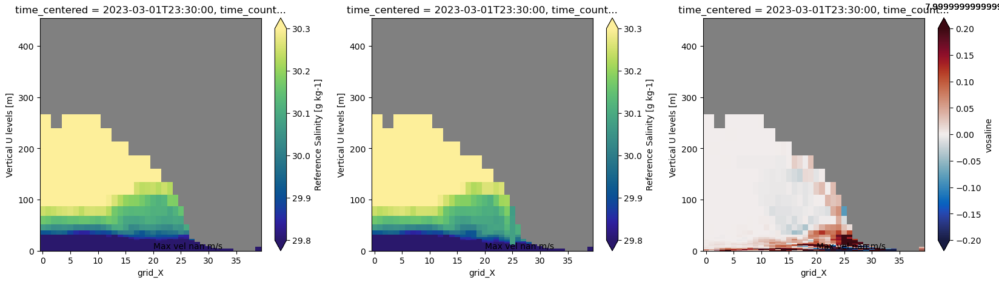

In [34]:
plot_vertical_quiver('base_again', base, 'tands', tands, 'vosaline', 23, 25, cm_salt, 30.3, 29.8, 0.2)